In [1]:
import torch
import os
import random
import torch.nn as nn
from PIL import Image
from torchvision.utils import make_grid
from torch.utils.data import Subset, random_split, Dataset, DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [3]:
# Helper Functions

def gram_matrix(features):
    # features: [C, H, W]
    C, H, W = features.size()
    features = features.view(C, H * W)
    G = torch.mm(features, features.t())  # [C, C]
    return G / (C * H * W)

def unnormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
    return tensor * std + mean
    
def show_random_pairs(data_loader, n=1, title1="Content Image", title2="Style Image"):
    count = 0
    for content_img, style_img, _ in data_loader:
        content_img = content_img[0]
        style_img = style_img[0]

        content_img = unnormalize(content_img).clamp(0, 1)
        style_img = unnormalize(style_img).clamp(0, 1)

        content_np = F.to_pil_image(content_img.cpu())
        style_np = F.to_pil_image(style_img.cpu())

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(content_np)
        plt.title(title1)
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(style_np)
        plt.title(title2)
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        count += 1
        if count >= n:
            break

def show_triplets(content, style, output, thresholds):
    content = content.cpu()
    style = style.cpu()
    output = output.cpu()
    thresholds = thresholds.cpu()

    for i in range(min(4, content.size(0))):
        fig, axs = plt.subplots(1, 3, figsize=(10, 4))
        axs[0].imshow(content[i].permute(1, 2, 0))
        axs[0].set_title("Content")
        axs[1].imshow(style[i].permute(1, 2, 0))
        axs[1].set_title("Style")
        axs[2].imshow(output[i].permute(1, 2, 0))
        axs[2].set_title("Stylized")

        for ax in axs:
            ax.axis("off")

        plt.suptitle(f"Style Threshold: {thresholds[i].item():.2f}", y=0.98)
        plt.tight_layout()
        plt.show()
        
def show_n_random_triplets(model, loader, n, device):
    model.eval()
    shown = 0

    with torch.no_grad():
        for content_img, style_img, threshold in loader:
            content_img = content_img.to(device)
            style_img = style_img.to(device)
            threshold = threshold.to(device).view(-1, 1, 1, 1).float()

            output_img = model(content_img, style_img, threshold)

            # Unnormalize for display
            content_vis = unnormalize(content_img)
            style_vis = unnormalize(style_img)
            output_vis = unnormalize(output_img)

            remaining = n - shown
            batch_size = content_img.size(0)
            to_show = min(batch_size, remaining)

            show_triplets(
                content_vis[:to_show],
                style_vis[:to_show],
                output_vis[:to_show],
                threshold.view(-1)[:to_show]
            )

            shown += to_show
            if shown >= n:
                break



In [4]:
class RandomPairDataset(Dataset):
    def __init__(self, content_dataset, style_dataset, threshold_range=(0.2, 0.8)):
        self.content_dataset = content_dataset
        self.style_dataset = style_dataset
        self.threshold_range = threshold_range

    def __len__(self):
        return max(len(self.content_dataset), len(self.style_dataset))

    def __getitem__(self, index):
        content_img, _ = self.content_dataset[random.randint(0, len(self.content_dataset) - 1)]
        style_img, _ = self.style_dataset[random.randint(0, len(self.style_dataset) - 1)]

        # Randomly generate a style threshold
        style_threshold = random.uniform(*self.threshold_range)

        return content_img, style_img, style_threshold

In [5]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3]),  # drop alpha if present
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# Data Loading

In [6]:
google_path = '/kaggle/input/image-classification'
wikiart_path = '/kaggle/input/wikiart'

# Content images from Google
content_dataset = ImageFolder(google_path, transform=transform)
print("Number of content images:",len(content_dataset))

# Style images from WikiArt
style_dataset = ImageFolder(wikiart_path, transform=transform)
print("Number of style images:", len(style_dataset))

Number of content images: 35225
Number of style images: 81444


# Downsampling & Data Splitting

In [7]:
TARGET_CONTENT_SIZE = 7000
TARGET_STYLE_SIZE = 3000

# Ensure reproducibility
random.seed(42)

# Downsample content dataset
content_indices = random.sample(range(len(content_dataset)), TARGET_CONTENT_SIZE)
content_dataset = Subset(content_dataset, content_indices)

# Downsample style dataset
style_indices = random.sample(range(len(style_dataset)), TARGET_STYLE_SIZE)
style_dataset = Subset(style_dataset, style_indices)

content_total = len(content_dataset)
style_total = len(style_dataset)

# Confirm new sizes
print("Downsampled content images:", len(content_dataset))
print("Downsampled style images:", len(style_dataset))

Downsampled content images: 7000
Downsampled style images: 3000


In [8]:
# Split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

In [9]:
content_train_size = int(train_ratio * content_total)
content_val_size = int(val_ratio * content_total)
content_test_size = content_total - content_train_size - content_val_size  # remainder

content_train, content_val, content_test = random_split(
    content_dataset,
    [content_train_size, content_val_size, content_test_size]
)
# Print Content Dataset Splits
print("Content dataset:")
print("  Train size:", len(content_train))
print("  Validation size:", len(content_val))
print("  Test size:", len(content_test))


style_train_size = int(train_ratio * style_total)
style_val_size = int(val_ratio * style_total)
style_test_size = style_total - style_train_size - style_val_size  # remainder

style_train, style_val, style_test = random_split(
    style_dataset,
    [style_train_size, style_val_size, style_test_size]
)

# Print Style Dataset Splits
print("\nStyle dataset:")
print("  Train size:", len(style_train))
print("  Validation size:", len(style_val))
print("  Test size:", len(style_test))


Content dataset:
  Train size: 4900
  Validation size: 1050
  Test size: 1050

Style dataset:
  Train size: 2100
  Validation size: 450
  Test size: 450


In [10]:
train_pairs = RandomPairDataset(content_train, style_train)
val_pairs = RandomPairDataset(content_val, style_val)
test_pairs = RandomPairDataset(content_test, style_test)

train_loader = DataLoader(train_pairs, batch_size=4, shuffle=True)
val_loader = DataLoader(val_pairs, batch_size=4, shuffle=False)
test_loader = DataLoader(test_pairs, batch_size=4, shuffle=False)

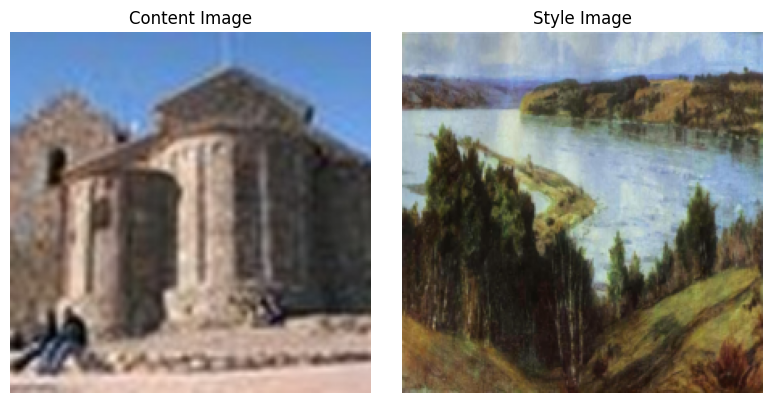

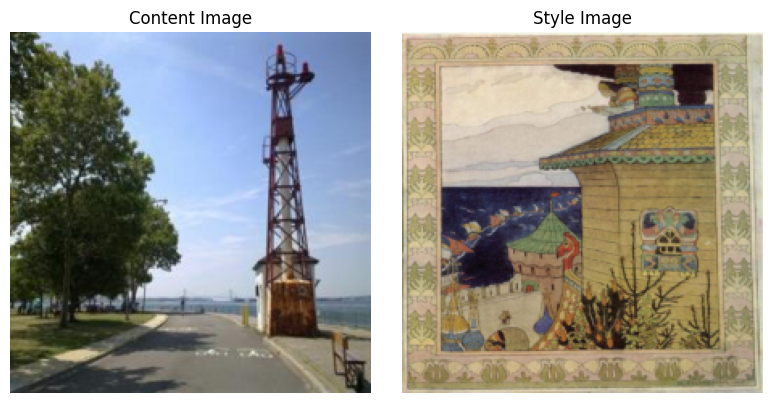

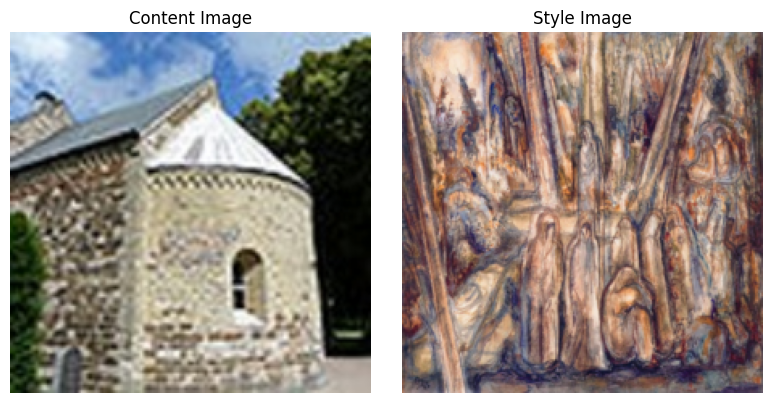

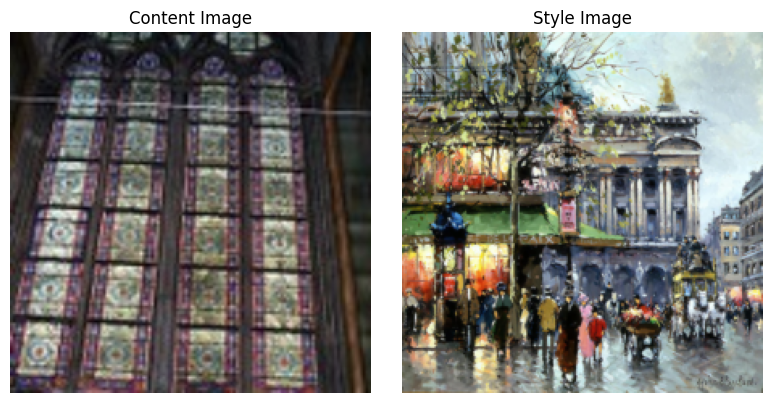

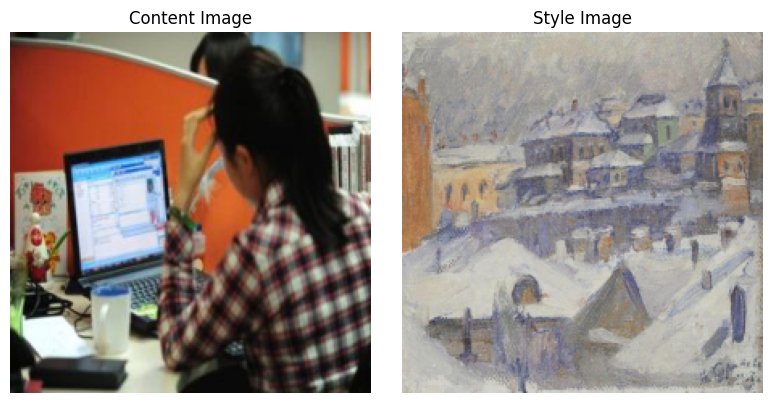

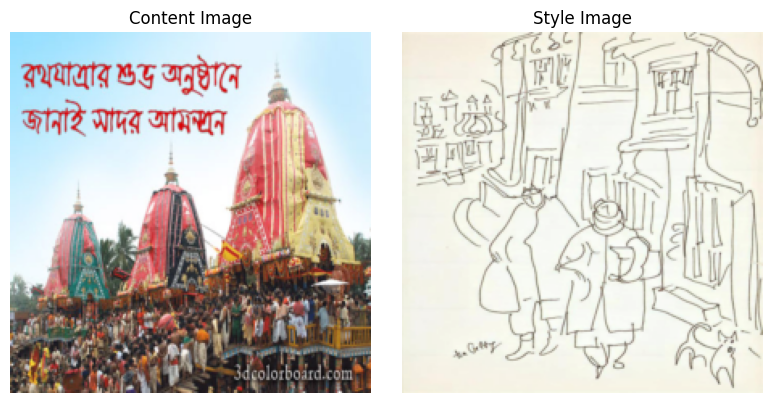

In [11]:
show_random_pairs(train_loader, n=2)
show_random_pairs(val_loader, n=2)
show_random_pairs(test_loader, n=2)

# Model

In [12]:
class VGGFeatures(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features
        self.vgg = vgg[:29]  # up to conv5_1

        self.layer_map = {
            '0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2', 
            '28': 'conv5_1'
        }

        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, x):
        features = {}
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.layer_map:
                features[self.layer_map[name]] = x
        return features


In [13]:
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Conv2d(512, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2),

            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 3, 3, padding=1)
        )

    def forward(self, x):
        return self.decoder(x)


In [14]:
class StyleTransferNet(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, content, style, threshold):
        # Get multi-layer features
        content_feats = self.encoder(content)
        style_feats = self.encoder(style)

        # Use only one layer to blend — like conv4_1 (used in NST literature)
        content_feat = content_feats['conv4_1']
        style_feat = style_feats['conv4_1']

        # Reshape threshold for broadcasting
        threshold = threshold.view(-1, 1, 1, 1).to(content.device).float()

        # Blend in feature space
        blended_feat = (1 - threshold) * content_feat + threshold * style_feat

        # Decode back to image
        out = self.decoder(blended_feat)
        return out


In [15]:
encoder = VGGFeatures().to(device)
decoder = Decoder().to(device)

model = StyleTransferNet(encoder, decoder).to(device)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=1e-4)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 189MB/s]  


# Traning Loop

In [16]:
num_epochs = 20
model.train()
encoder.eval()  # Make sure VGG is in eval mode

for epoch in range(num_epochs):
    epoch_loss = 0
    model.train()

    for content_img, style_img, threshold in train_loader:
        content_img = content_img.to(device)
        style_img = style_img.to(device)
        threshold = threshold.to(device).view(-1, 1, 1, 1).float()

        # Forward pass
        output_img = model(content_img, style_img, threshold)

        # Extract VGG features
        with torch.no_grad():
            content_feats = encoder(content_img)
            style_feats = encoder(style_img)

        output_feats = encoder(output_img)

        total_loss = 0
        for i in range(content_img.size(0)):
            # Content loss from conv4_2
            c_feat = output_feats['conv4_2'][i]
            c_target = content_feats['conv4_2'][i]
            content_loss = torch.nn.functional.mse_loss(c_feat, c_target)

            # Style loss from 5 layers
            style_loss = 0
            for layer in ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']:
                g_o = gram_matrix(output_feats[layer][i])
                g_s = gram_matrix(style_feats[layer][i])
                style_loss += torch.nn.functional.mse_loss(g_o, g_s)
            style_loss /= 5

            t = threshold[i].item()
            total_loss += (1 - t) * content_loss + t * style_loss

        loss = total_loss / content_img.size(0)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    # ========= VALIDATION =========
    model.eval()
    val_loss = 0

    with torch.no_grad():
        for content_img, style_img, threshold in val_loader:
            content_img = content_img.to(device)
            style_img = style_img.to(device)
            threshold = threshold.to(device).view(-1, 1, 1, 1).float()

            output_img = model(content_img, style_img, threshold)

            content_feats = encoder(content_img)
            style_feats = encoder(style_img)
            output_feats = encoder(output_img)

            total_val_loss = 0
            for i in range(content_img.size(0)):
                c_feat = output_feats['conv4_2'][i]
                c_target = content_feats['conv4_2'][i]
                content_loss = torch.nn.functional.mse_loss(c_feat, c_target)

                style_loss = 0
                for layer in ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']:
                    g_o = gram_matrix(output_feats[layer][i])
                    g_s = gram_matrix(style_feats[layer][i])
                    style_loss += torch.nn.functional.mse_loss(g_o, g_s)
                style_loss /= 5

                t = threshold[i].item()
                total_val_loss += (1 - t) * content_loss + t * style_loss

            val_loss += total_val_loss.item() / content_img.size(0)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {epoch_loss/len(train_loader):.4f} | Val Loss: {val_loss/len(val_loader):.4f}")


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:949: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch 1/20 | Train Loss: 4.4565 | Val Loss: 3.8623
Epoch 2/20 | Train Loss: 3.5833 | Val Loss: 3.3846
Epoch 3/20 | Train Loss: 3.2452 | Val Loss: 3.0944
Epoch 4/20 | Train Loss: 3.0371 | Val Loss: 3.0392
Epoch 5/20 | Train Loss: 2.8577 | Val Loss: 2.8935
Epoch 6/20 | Train Loss: 2.8118 | Val Loss: 2.8228
Epoch 7/20 | Train Loss: 2.7116 | Val Loss: 2.7850
Epoch 8/20 | Train Loss: 2.6509 | Val Loss: 2.6605
Epoch 9/20 | Train Loss: 2.5550 | Val Loss: 2.6104
Epoch 10/20 | Train Loss: 2.5062 | Val Loss: 2.5494
Epoch 11/20 | Train Loss: 2.4482 | Val Loss: 2.6078
Epoch 12/20 | Train Loss: 2.4121 | Val Loss: 2.4408
Epoch 13/20 | Train Loss: 2.3740 | Val Loss: 2.4558
Epoch 14/20 | Train Loss: 2.3306 | Val Loss: 2.4696
Epoch 15/20 | Train Loss: 2.2838 | Val Loss: 2.3924
Epoch 16/20 | Train Loss: 2.2632 | Val Loss: 2.3741
Epoch 17/20 | Train Loss: 2.2283 | Val Loss: 2.3970
Epoch 18/20 | Train Loss: 2.2048 | Val Loss: 2.3732
Epoch 19/20 | Train Loss: 2.1599 | Val Loss: 2.5249
Epoch 20/20 | Train L

# Testing

In [17]:
def unnormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
    return tensor * std + meandef show_triplets(content, style, output, thresholds):
    content = content.cpu()
    style = style.cpu()
    output = output.cpu()
    thresholds = thresholds.cpu()

    for i in range(min(4, content.size(0))):
        fig, axs = plt.subplots(1, 3, figsize=(10, 4))
        axs[0].imshow(content[i].permute(1, 2, 0))
        axs[0].set_title("Content")
        axs[1].imshow(style[i].permute(1, 2, 0))
        axs[1].set_title("Style")
        axs[2].imshow(output[i].permute(1, 2, 0))
        axs[2].set_title("Stylized")

        for ax in axs:
            ax.axis("off")

        plt.suptitle(f"Style Threshold: {thresholds[i].item():.2f}", y=0.98)
        plt.tight_layout()
        plt.show()
        
def show_n_random_triplets(model, loader, n, device):
    model.eval()
    shown = 0

    with torch.no_grad():
        for content_img, style_img, threshold in loader:
            content_img = content_img.to(device)
            style_img = style_img.to(device)
            threshold = threshold.to(device).view(-1, 1, 1, 1).float()

            output_img = model(content_img, style_img, threshold)

            # Unnormalize for display
            content_vis = unnormalize(content_img)
            style_vis = unnormalize(style_img)
            output_vis = unnormalize(output_img)

            remaining = n - shown
            batch_size = content_img.size(0)
            to_show = min(batch_size, remaining)

            show_triplets(
                content_vis[:to_show],
                style_vis[:to_show],
                output_vis[:to_show],
                threshold.view(-1)[:to_show]
            )

            shown += to_show
            if shown >= n:
                break

KeyError: 0

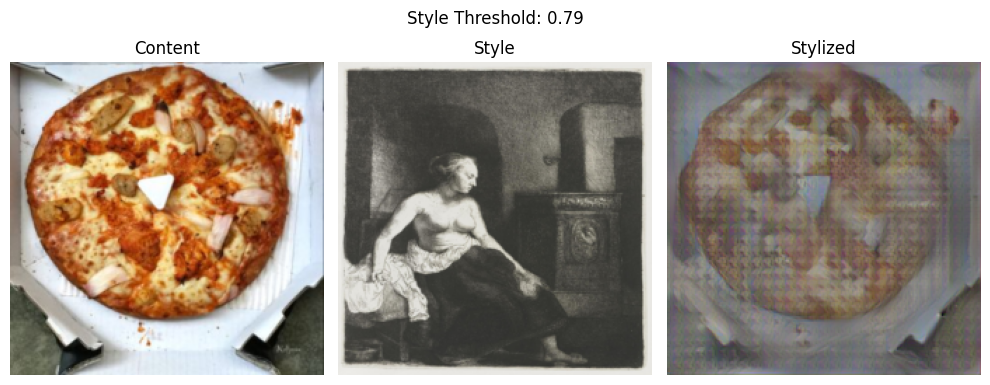

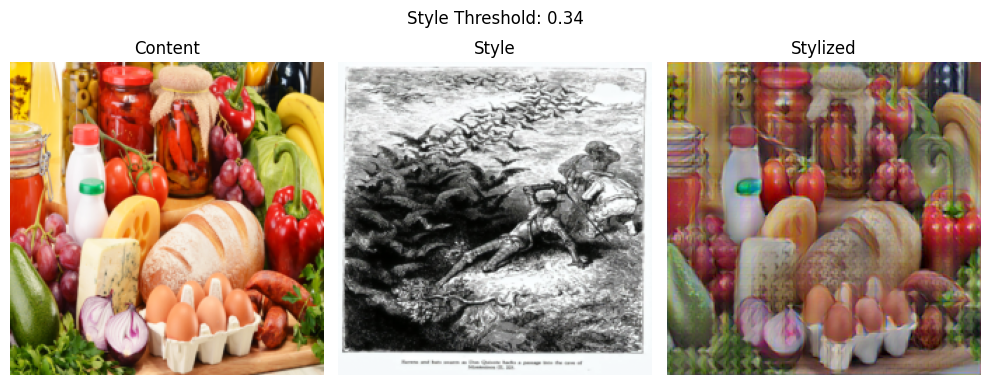

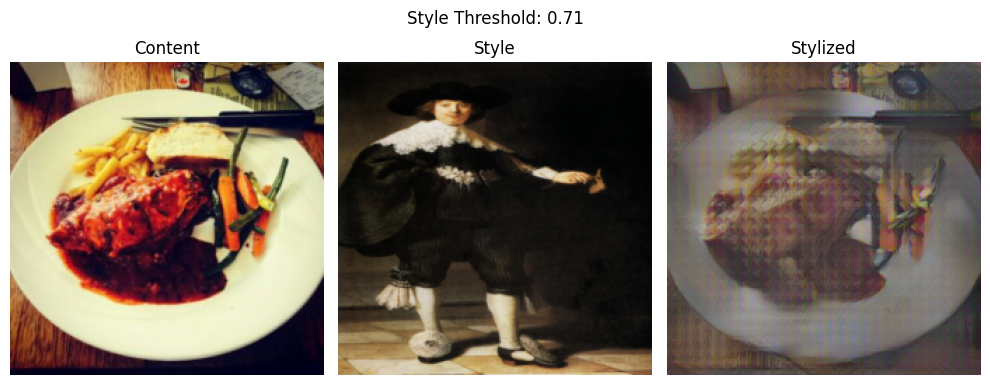

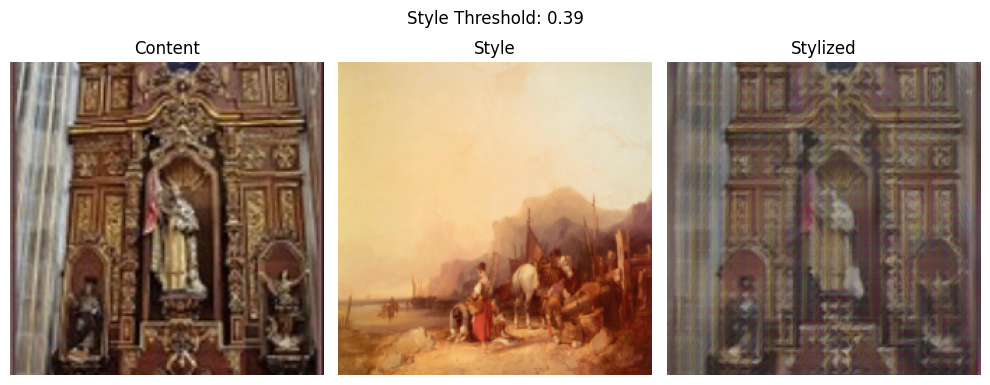

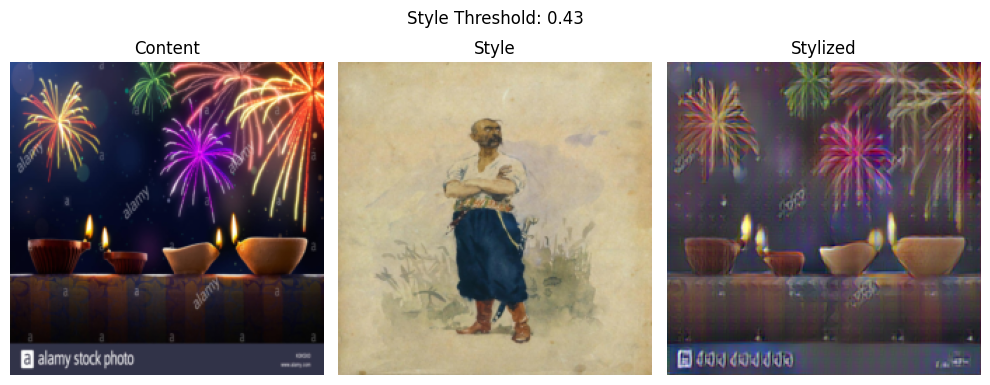

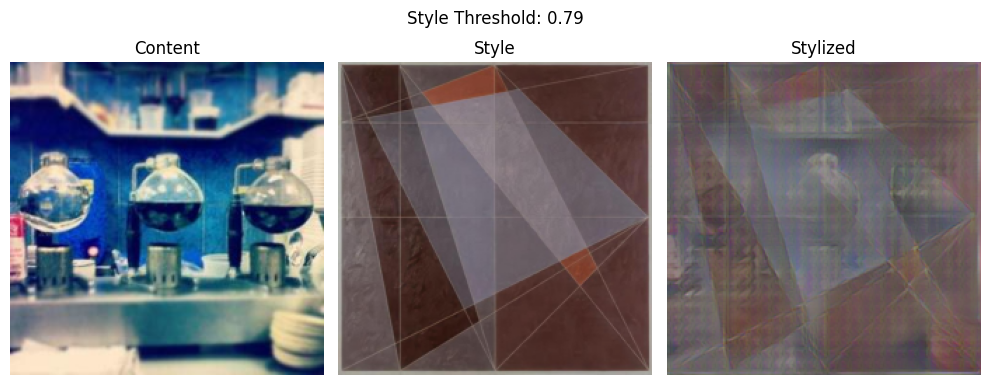

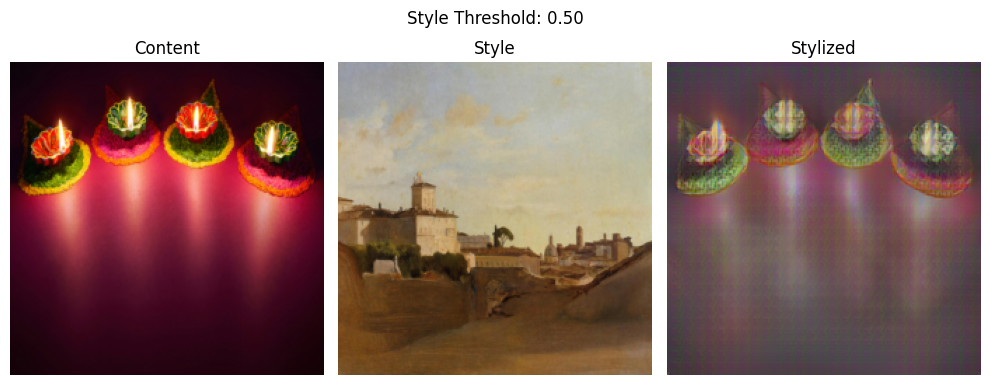

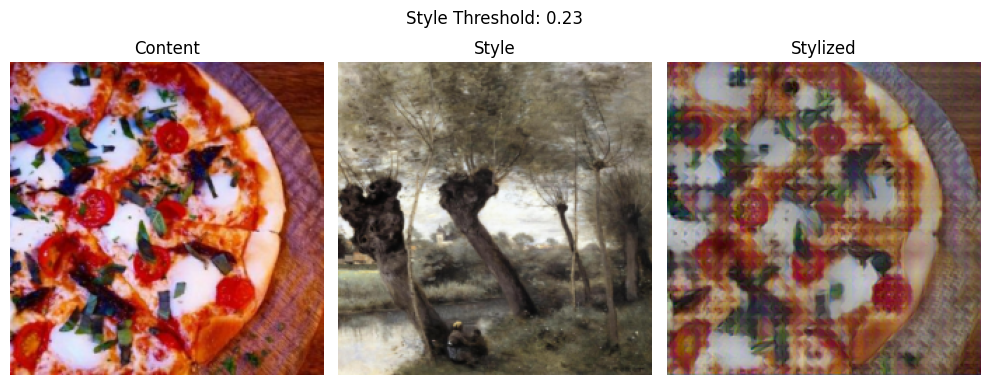

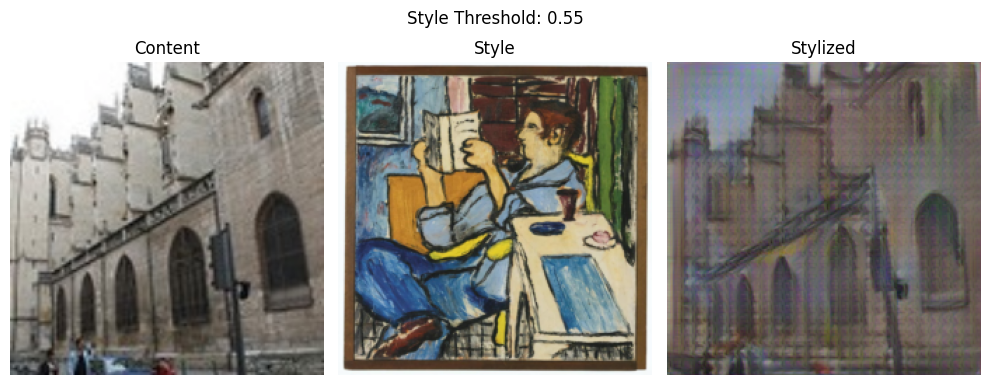

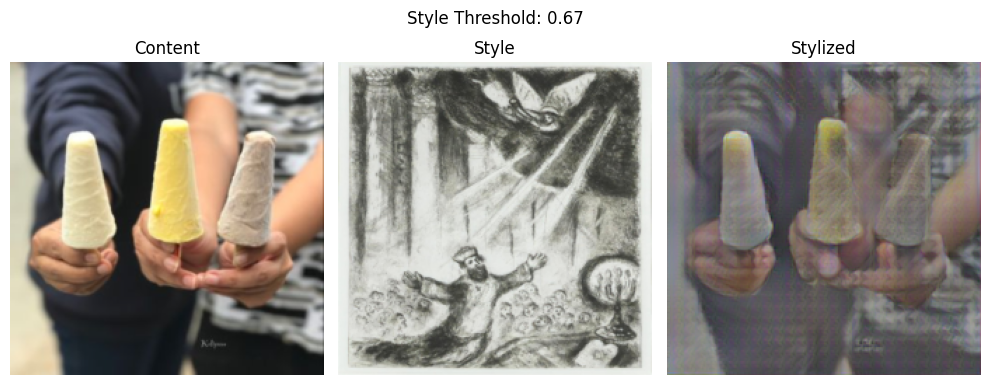

In [18]:
show_n_random_triplets(model, test_loader, n=10, device=device)

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image


In [20]:
import timm
import torch.nn as nn

class ViTEncoder(nn.Module):
    def __init__(self):
        super(ViTEncoder, self).__init__()
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        self.vit.head = nn.Identity()  # remove classification head

    def forward(self, x):
        # Extract patch embeddings: shape = [B, N, D]
        x = self.vit.patch_embed(x)
        
        # Global average pooling over all patches
        x = x.mean(dim=1)  # Result: shape [B, D] = [B, 768]
        return x


In [21]:
class SimpleDecoder(nn.Module):
    def __init__(self, embed_dim=768):
        super(SimpleDecoder, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(embed_dim, 512 * 7 * 7),
            nn.ReLU()
        )
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),  # 14x14
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),  # 28x28
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),   # 56x56
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, stride=4, padding=0),     # 224x224
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x)                   # [B, 512*7*7]
        x = x.view(-1, 512, 7, 7)        # [B, 512, 7, 7]
        x = self.deconv(x)              # [B, 3, 224, 224]
        return x


In [22]:
class StyleTransferViT(nn.Module):
    def __init__(self):
        super(StyleTransferViT, self).__init__()
        self.encoder = ViTEncoder()
        self.decoder = SimpleDecoder(embed_dim=768)

    def forward(self, content_img, style_img, threshold=None):
        # Ensure all inputs are float32
        content_img = content_img.to(torch.float32)
        style_img = style_img.to(torch.float32)
    
        if threshold is not None:
            threshold = threshold.to(torch.float32)
    
        content_feat = self.encoder(content_img)  # shape: [B, 768]
        style_feat = self.encoder(style_img)      # shape: [B, 768]
    
        assert content_feat.shape == style_feat.shape, "Encoder outputs mismatch"
    
        if threshold is not None:
            threshold = threshold.view(-1, 1)  # shape: [B, 1]
            fused_feat = (1 - threshold) * content_feat + threshold * style_feat
        else:
            fused_feat = (content_feat + style_feat) / 2
    
        fused_feat = fused_feat.to(torch.float32)  # Ensure this before decoder
    
        return self.decoder(fused_feat)



In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = StyleTransferViT().to(device)
model.eval()


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

StyleTransferViT(
  (encoder): ViTEncoder(
    (vit): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=768, out_features=768, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): Identity()
          (drop_path1): Identity()
          (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=7

Content shape: torch.Size([4, 3, 224, 224])
Style shape: torch.Size([4, 3, 224, 224])
Threshold shape: torch.Size([4])


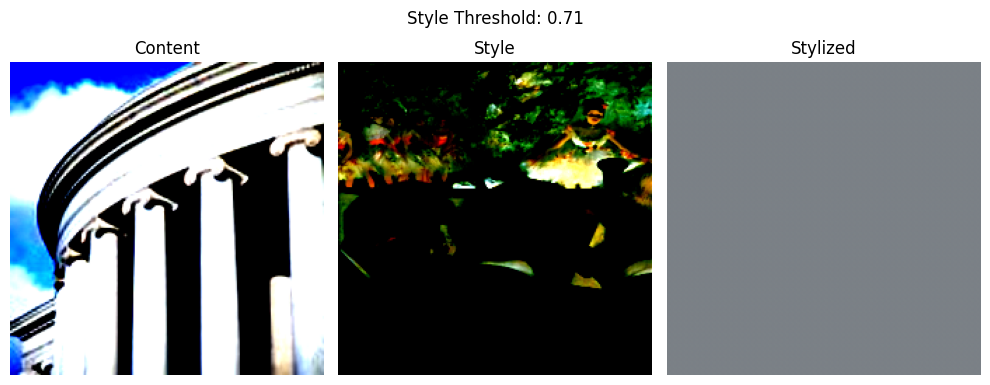

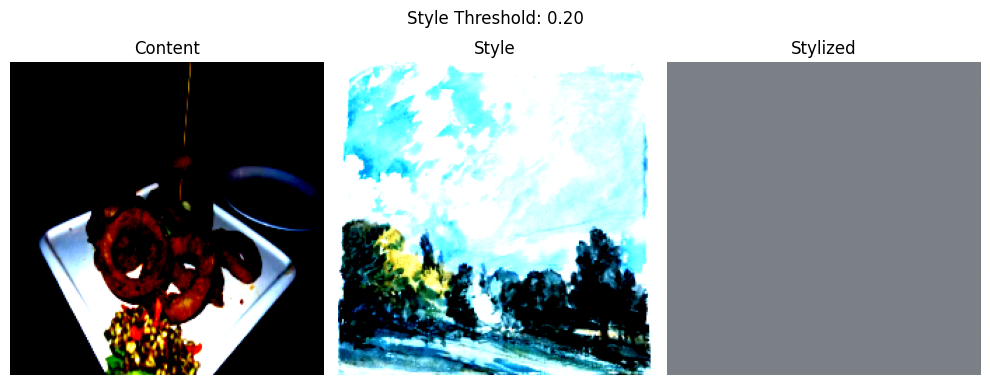

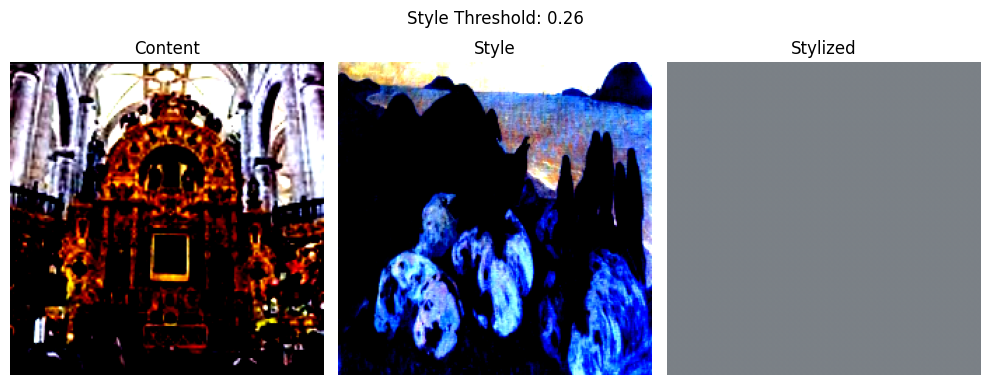

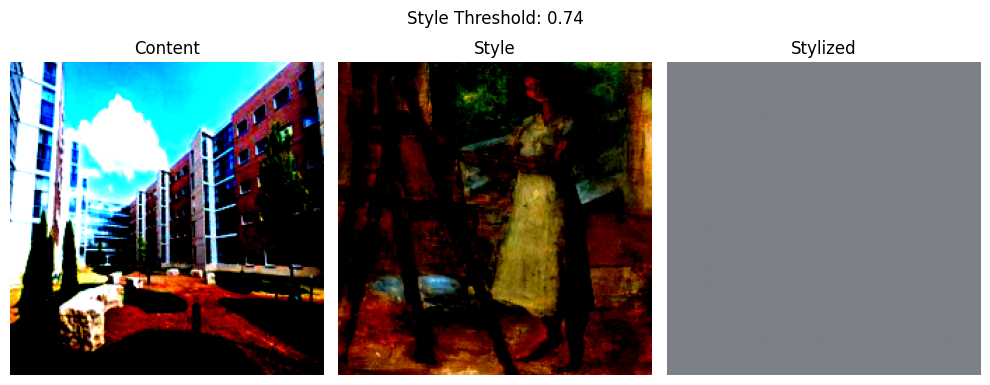

In [24]:
# Make sure the model is in eval mode
model.eval()

# Take one batch from validation set
content_img, style_img, threshold = next(iter(val_loader))
content_img = content_img.to(device)
style_img = style_img.to(device)
threshold = threshold.to(device)

# Generate stylized output
with torch.no_grad():
    print("Content shape:", content_img.shape)
    print("Style shape:", style_img.shape)
    print("Threshold shape:", threshold.shape)

    stylized_img = model(content_img, style_img, threshold)

# Visualize content/style/output side-by-side
show_triplets(content_img, style_img, stylized_img, threshold)


In [25]:
import torch.optim as optim

criterion = nn.MSELoss()
optimizer = optim.Adam(model.decoder.parameters(), lr=1e-4)

num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0

    for content_img, style_img, threshold in train_loader:
        content_img = content_img.to(device)
        style_img = style_img.to(device)
        threshold = threshold.to(device)

        optimizer.zero_grad()
        output = model(content_img, style_img, threshold)
        loss = criterion(output, content_img)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")

    

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1/20, Loss: 1.5457
Epoch 2/20, Loss: 1.5130
Epoch 3/20, Loss: 1.4983
Epoch 4/20, Loss: 1.4923
Epoch 5/20, Loss: 1.4622
Epoch 6/20, Loss: 1.4829
Epoch 7/20, Loss: 1.4643
Epoch 8/20, Loss: 1.4683
Epoch 9/20, Loss: 1.4598
Epoch 10/20, Loss: 1.4551
Epoch 11/20, Loss: 1.4705
Epoch 12/20, Loss: 1.4623
Epoch 13/20, Loss: 1.4652
Epoch 14/20, Loss: 1.4481
Epoch 15/20, Loss: 1.4619
Epoch 16/20, Loss: 1.4650
Epoch 17/20, Loss: 1.4662
Epoch 18/20, Loss: 1.4561
Epoch 19/20, Loss: 1.4676
Epoch 20/20, Loss: 1.4555


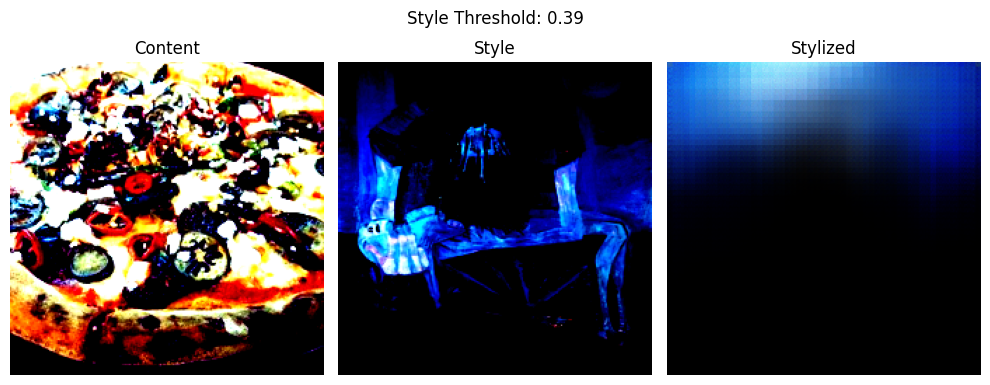

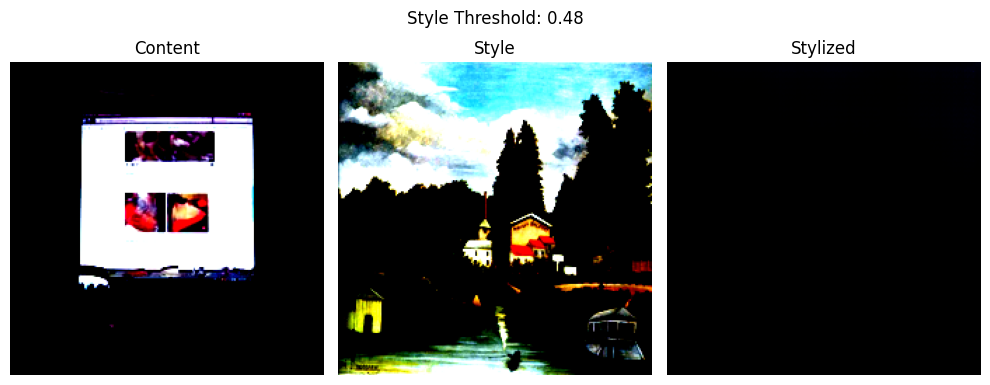

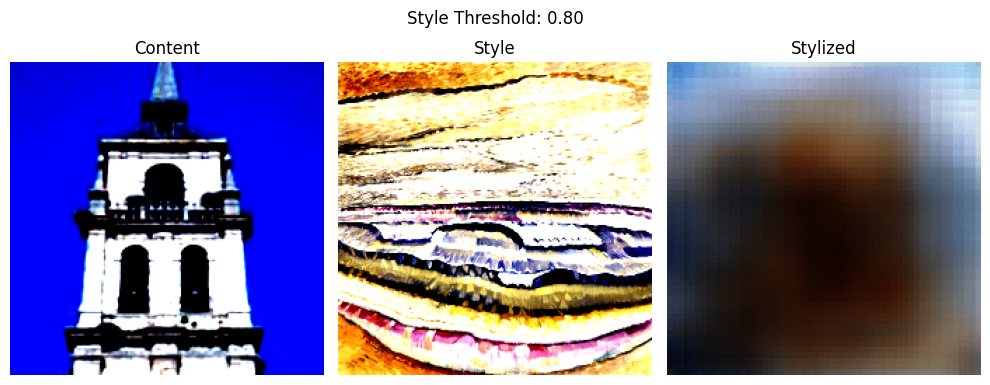

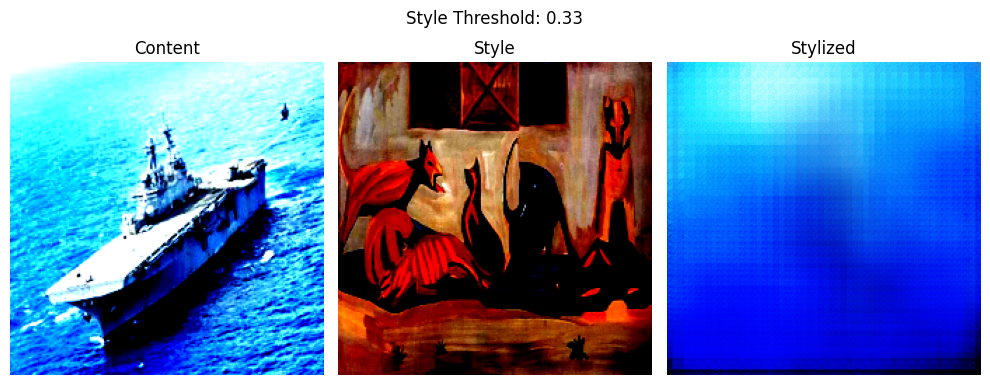

In [28]:
#Optional preview
model.eval()
with torch.no_grad():
    c, s, t = next(iter(val_loader))
    stylized_img = model(c.to(device), s.to(device), t.to(device))
show_triplets(c, s, stylized_img, t)


In [29]:
from torch.nn.functional import mse_loss

model.eval()
total_mse = 0.0
num_batches = 0

with torch.no_grad():
    for content_img, style_img, threshold in val_loader:
        content_img = content_img.to(device)
        style_img = style_img.to(device)
        threshold = threshold.to(device)

        stylized_img = model(content_img, style_img, threshold)

        # Compare stylized vs content (or style depending on your goal)
        loss = mse_loss(stylized_img, content_img)
        total_mse += loss.item()
        num_batches += 1

average_mse = total_mse / num_batches
print(f"Average MSE over validation set: {average_mse:.6f}")


/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:949: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Average MSE over validation set: 1.510721
